# Week 03

## Other Kinds of Lists: Audio

### Setup

Run the following 2 cells to import all necessary libraries and helpers for this week's exercises

In [2]:
!curl -sL "https://github.com/PSAM-5020-2026F-A/5020-utils/raw/main/src/audio_utils.py" -O audio_utils.py
!curl -sL "https://github.com/PSAM-5020-2026F-A/WK03/raw/main/data.tgz" -O data.tgz
!tar -xzf data.tgz

In [5]:
%pip install librosa matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 23.5 MB/s  0:00:00
  Attempting uninstall: decorator
    Found existing installation: decorator 5.1.1
    Uninstalling decorator-5.1.1:
      Successfully uninstalled decorator-5.1.1━━━━━━━━━━━━━━━━━━━━ 1/5 [decorator]
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5/5 [librosa]m4/5 [librosa]
Note: you may need to restart the kernel to use updated packages.


In [6]:
import librosa
import matplotlib.pyplot as plt
import numpy as np
import wave

from IPython.display import Audio

from audio_utils import list_to_wav
from audio_utils import fft, stft, cluster_fft_freqs

## Digital Audio

Air pressure waves converted to electrical pulses, which are then sampled and turned into a sequence of numbers.

<img src="https://psam-5020-2026f-a.github.io/5020-imgs/WK03/audio-00.jpg" width="720px">

### Playing an audio file

Easy !

In [7]:
display(Audio("./data/two-bits.wav"))

### Look at the `data/` directory, and load and play some of the other files:

In [ ]:
# TODO: play other files


### Loading an audio file for analysis, manipulation, etc

is a bit more work. The Python [wave module](https://docs.python.org/3/library/wave.html) helps a lot, but there are still some steps that we have to take.

Let's first open a `.wav` file and read it into a wave object:

In [9]:
sound_file_path = "./data/air-horn.wav"
wav_in = wave.open(sound_file_path, mode="rb")

print(wav_in)
print(wav_in.getparams()) #getparams() prints the parameters of the WAV file -- sampwidth = bit depth, frame rate = sample rate, nframes = number of samples
# about 2 seconds long
display(Audio(sound_file_path))

_wave_params(nchannels=1, sampwidth=2, framerate=44100, nframes=84039, comptype='NONE', compname='not compressed')


### Audio length, channels, samples, rate, depth

<img src="https://psam-5020-2026f-a.github.io/5020-imgs/WK03/audio-01.jpg" width="900px">

`Audio length`: The duration of an audio file in seconds. $Audio\ Length = \frac{Number\ of\ Samples}{Sample\ Rate}$

`Channels`: The different signals that make up an audio file.

`Amplitude`: The strength of the audio signal. Related to volume.

`Samples`: List of numbers that represent the amplitude of an audio signal at specific time intervals.

`Frame`: Collection of samples from all channels at a given time. $Number\ of\ Frames = \frac{Number\ of\ Samples}{Number\ of\ Channels}$

`Sample Rate`: How many times per second the original audio signal was recorded. $Sample\ Rate = \frac{Number\ of\ Frames}{Audio\ Length}$

`Bit Depth` / `Sample Width`: How many different unique numbers are used to represent a sample.

### Open some of the other files in the `data/` directory and print their parameters

Do those make more sense now?

In [ ]:
# TODO: open and print params for some of the other files



## Samples
### Getting sample values

We first have to open a `.wav` file with `wave.open()` to get a file object.

We can then use the file object's `readframes()` function to read the file's contents into a buffer of `bytes`, and the `frombuffer()` function to turn a buffer of `bytes` into a list of `integers`.

And, finally, we can use `list()` to put it all inside a regular Python list.

<img src="https://psam-5020-2026f-a.github.io/5020-imgs/WK03/audio-02.jpg" width="720px">

In [10]:
sound_file_path = "./data/western.wav"
wav_in = wave.open(sound_file_path, mode="rb")
read_buffer = wav_in.readframes(wav_in.getnframes()) # read frames then get how many frames
my_samples = list(np.frombuffer(read_buffer, dtype=np.int16))

print(wav_in.getparams())

_wave_params(nchannels=2, sampwidth=2, framerate=44100, nframes=613126, comptype='NONE', compname='not compressed')


# 😫

That's a lot of cryptic lines of code just to open a file and get a list of numbers !

And we don't even get a list of numbers in the end !

In [11]:
print(my_samples[:10])

print(len(my_samples))

[np.int16(-1), np.int16(-1), np.int16(0), np.int16(2), np.int16(1), np.int16(-3), np.int16(-3), np.int16(4), np.int16(4), np.int16(-4)]
1226252


### Get number of samples
There's a way to calculate the number of samples from the wave object's parameters.

Can you get it from the `my_samples` list instead?

What about the min and max sample values?

In [12]:
# TODO: get number of samples
# TODO: get min/max sample values

min(my_samples), max(my_samples)

(np.int16(-23164), np.int16(22689))

### Visualizing

At least we can visualize it now using matplotlib and play it from the list of samples.

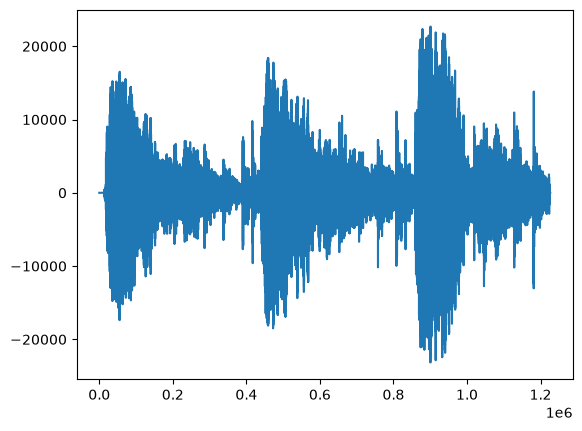

In [13]:
plt.plot(my_samples)
plt.show()

display(Audio(my_samples, rate=44100))

# 😫😫

For sound files with more than one channel, the `Audio()` function expects the samples in a format that is different from the one returned by `wave.open()` and `wave.readframes()`.

<img src="https://psam-5020-2026f-a.github.io/5020-imgs/WK03/wav-x-audio.jpg" height="400px">

Argh!

We can give `Audio()` every other sample and listen to just one of the channels.

We could do this with a for-loop or list comprehension, but we can also use slicing with a third parameter.

Just like the `range()` function can take a third parameter to specify the steps/skips in a sequence, we can use slice with a third parameter to step through the array by every other sample:

In [14]:
display(Audio(my_samples[::2], rate=44100))

But, we should really use a more powerful function to read our wave files and return a single-channel array that combines all of the channels in an audio file. And, it would be nice if we could work with other file formats too.

The `librosa.load()` function does exactly this.

The `librosa` library gives us an extensive collection of tools for working with audio. The `load()` function can handle multiple file formats (`.mp3`, `.ogg`, etc), and multiple channels, and by default it returns a single array of samples calculated by averaging all values from each frame.

For example, for a 2-channel audio file it sums every $2$ samples and divides that sum by $2$.

The `load()` function also returns the sampling rate of the audio. We have to keep this around in order to play the audio, since it tells the player how fast to read the samples.

Let's see how to use it:

In [18]:
sound_file_path = "./data/western.wav"
samples, sr = librosa.load(sound_file_path) # make sure to assingn the result of this call to 2 different results (samples, sr)

display(Audio(samples, rate=sr)) # getting list of samples and sample rate

# TODO : check the length of the samples array. Compared to the info from getparams(), does it make sense?

Now we can plot and listen to the samples correctly and do any processing using only one list of samples

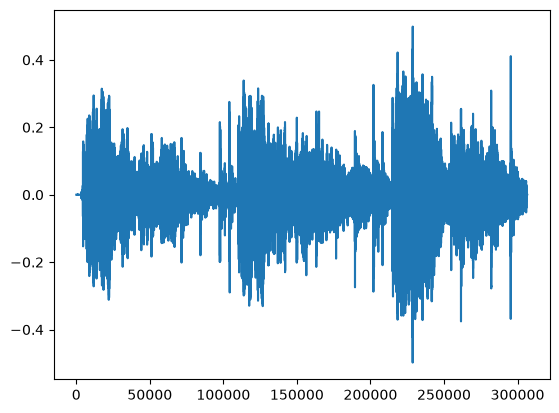

In [16]:
plt.plot(samples)
plt.show()

display(Audio(samples, rate=sr))

In [20]:
len(samples), sr

(306563, 22050)

# 👯

### Repeat the previous process for a different audio file
Open an audio file and get a list of its samples.
Play the audio to make sure it sounds like what you expect.

In [ ]:
# TODO: read another file into an array of samples



# TODO: print number of samples

# TODO: plot wave form and play audio

## Manipulating Audio

Once we have a list of samples we can process, analyze and manipulate the audio by performing list operations and simple arithmetics.

<img src="https://psam-5020-2026f-a.github.io/5020-imgs/WK03/audio-02.jpg" width="720px">

### Change volume

To change the volume of an audio file all we have to do is multiply its samples by a constant.

If the constant is greater than $1$ it will get louder, if it's between $0$ and $1$ it will get softer.

<img src="https://psam-5020-2026f-a.github.io/5020-imgs/WK03/audio-04.jpg" width="720px">

### Process the samples array to makes the audio softer and then louder
Check results visually and by listening to the audio

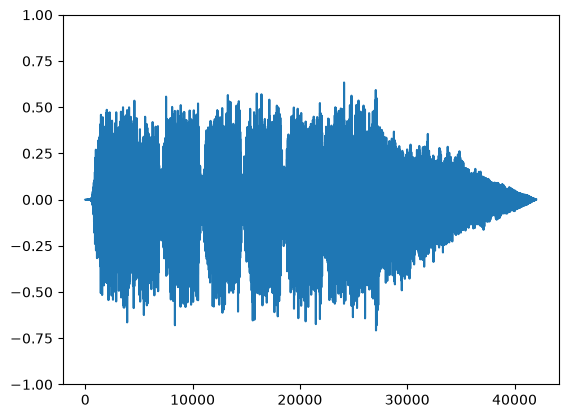

In [21]:
sound_file_path = "./data/air-horn.wav"
samples, sr = librosa.load(sound_file_path)

plt.plot(samples)
plt.ylim([-1, 1])
plt.show()

display(Audio(sound_file_path))

In [22]:
len(samples), sr

(42020, 22050)

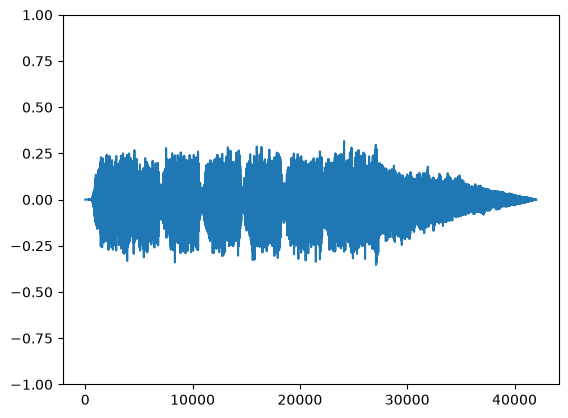

In [23]:
# TODO: make samples softer

softer_samples = []
for s in samples:
    softer_samples.append(s * 0.5)

plt.plot(softer_samples)
plt.ylim([-1, 1])
plt.show()

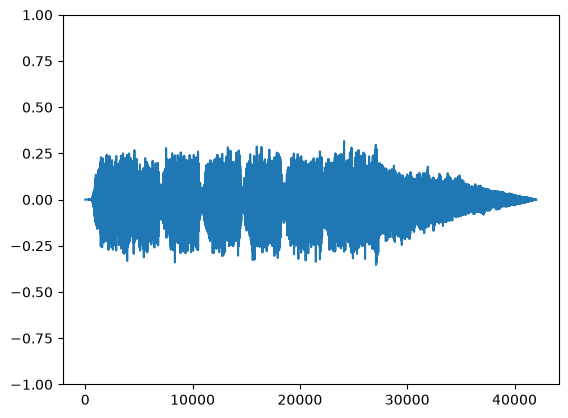

In [24]:
# TODO: (optional practice) make samples softer with comprehensions

softer_samples_comp = [s * 0.5 for s in samples]

plt.plot(softer_samples_comp)
plt.ylim([-1, 1])
plt.show()

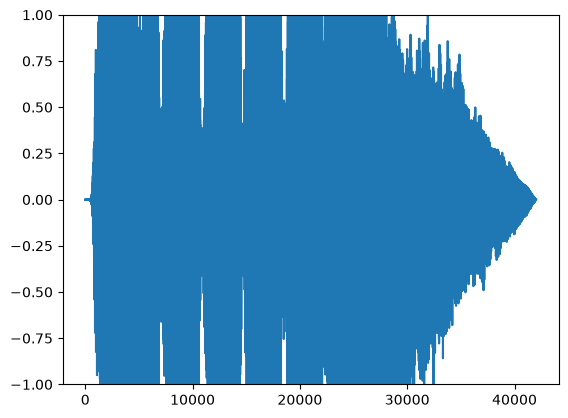

In [25]:
# TODO: make samples louder

louder_samples = [s * 3 for s in samples]

plt.plot(louder_samples)
plt.ylim([-1, 1])
plt.show()

In [26]:
display(Audio(softer_samples, rate=sr))

### NOTE: about playing modified samples

The `display(Audio(samples))` function tries to be smart when it plays back our samples and automatically adjusts samples that are too loud or too soft.

To hear the difference in making samples softer/louder we have to save the file and then play from the file.

### Saving our samples

We can use the `list_to_wav()` function to save a sequence of samples as a mono `.wav` file:

```py
list_to_wav(new_samples, sample_rate, "out.wav")
```

### Save the modified sample lists to hear them louder and softer

In [27]:
# TODO: save list of softer samples as a wav file
list_to_wav(softer_samples, sr, "out.wav")

# TODO: play from file
display(Audio("out.wav"))

In [28]:
# TODO: save list of louder samples as a wav file
list_to_wav(louder_samples, sr, "out_louder.wav")

# TODO: play from file
display(Audio("out_louder.wav"))

### Change speed

If we just duplicate each sample in our sequence, while keeping the sample rate the same, we'll end up with an audio file that is twice as long as the original.

<img src="https://psam-5020-2026f-a.github.io/5020-imgs/WK03/audio-05.jpg" width="720px">

And, conversely, if we remove every other sample, we'll get an audio signal that is half of the original length.

### Process the samples array to makes the audio shorter and longer
Check results visually and by listening to the audio

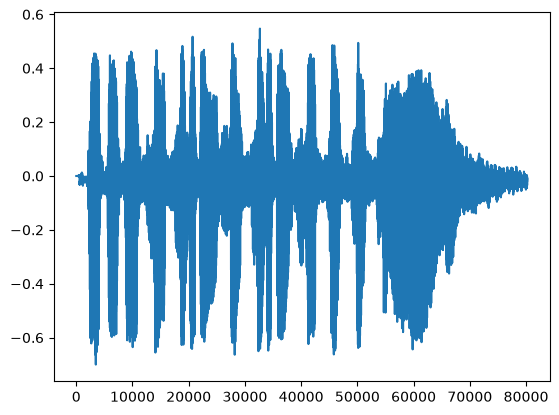

80201 samples


In [55]:
sound_file_path = "./data/horn.wav"
samples, sr = librosa.load(sound_file_path)

plt.plot(samples)
plt.show()

display(Audio(samples, rate=sr))
print(len(samples), "samples")

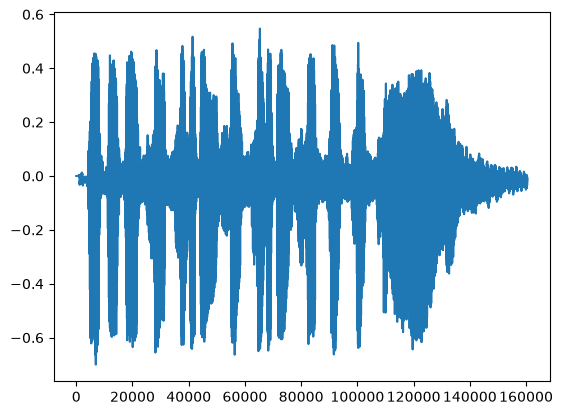

160402 samples


In [56]:
# TODO: double the samples to hear the effects
double_samples = []

# add some code to double_samples here
for s in samples:
    double_samples.append(s)
    double_samples.append(s)

plt.plot(double_samples)
plt.show()

display(Audio(double_samples, rate=sr))
print(len(double_samples), "samples")

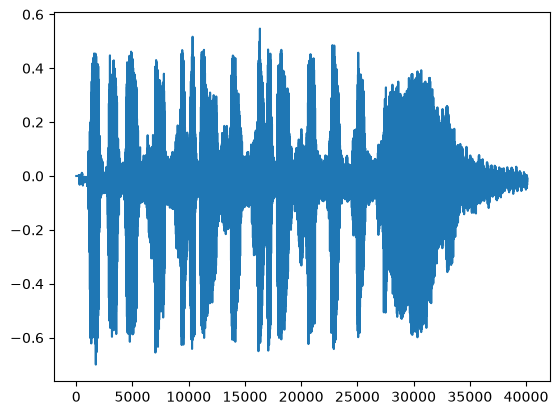

40101 samples


In [58]:
# TODO: half the samples to hear the effects
half_samples = []

# add some code to grab every other sample here
for n in range(0, len(samples), 2):
    half_samples.append(samples[n])

plt.plot(half_samples)
plt.show()

display(Audio(half_samples, rate=sr))
print(len(half_samples), "samples")

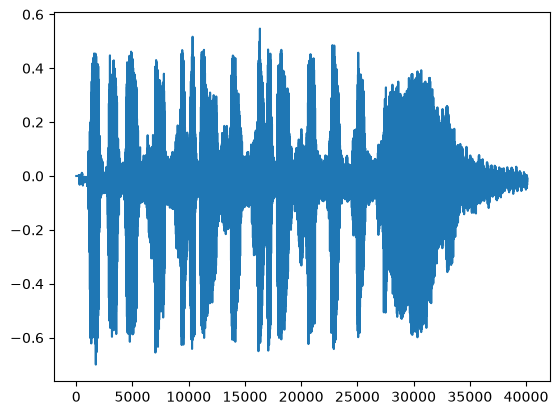

40101 samples


In [57]:
# TODO: half the samples to hear the effects
half_samples = samples[::2]

# add some code to grab every other sample here

plt.plot(half_samples)
plt.show()

display(Audio(half_samples, rate=sr))
print(len(half_samples), "samples")

### Reverse

Flipping the order of the samples will make the audio sound backwards.

<img src="https://psam-5020-2026f-a.github.io/5020-imgs/WK03/audio-06.jpg" width="720px">

The following cell reverses the samples

In [59]:
sound_file_path = "./data/two-bits.wav"
samples, sr = librosa.load(sound_file_path)

rev_samples = list(reversed(samples))

And we can check the effect running the cell below

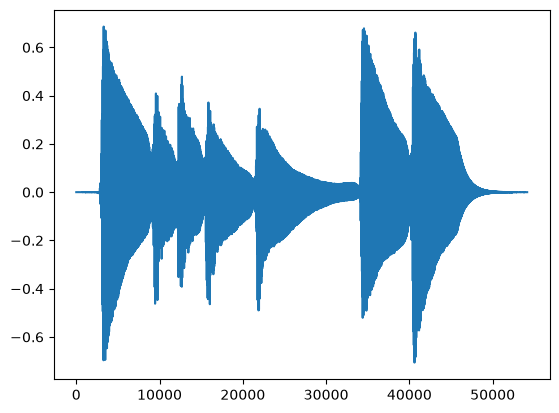

[-1.6750919e-06  8.4402927e-08  8.0654409e-06  3.3735487e-06
 -1.5946363e-05 -1.2026821e-06  2.1743348e-05 -2.6388063e-05
  1.1615024e-05  1.2251976e-05 -1.2590597e-05  1.1236485e-05
  3.0101419e-06 -1.5216341e-05  1.4480499e-05  2.1919404e-06]


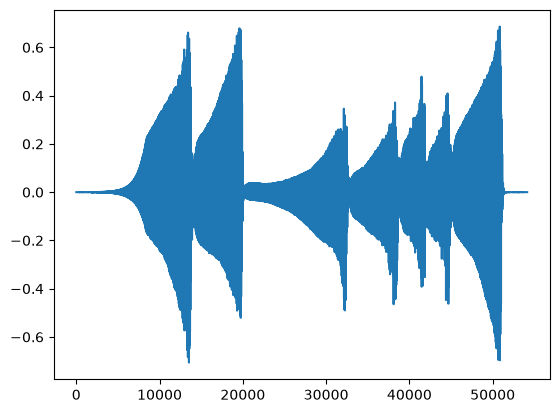

[np.float32(2.1919404e-06), np.float32(1.4480499e-05), np.float32(-1.5216341e-05), np.float32(3.0101419e-06), np.float32(1.1236485e-05), np.float32(-1.2590597e-05), np.float32(1.2251976e-05), np.float32(1.1615024e-05), np.float32(-2.6388063e-05), np.float32(2.1743348e-05), np.float32(-1.2026821e-06), np.float32(-1.5946363e-05), np.float32(3.3735487e-06), np.float32(8.065441e-06), np.float32(8.440293e-08), np.float32(-1.6750919e-06)]


In [60]:
plt.plot(samples)
plt.show()
display(Audio(sound_file_path))
print(samples[:16])

plt.plot(rev_samples)
plt.show()
display(Audio(rev_samples, rate=sr))
print(rev_samples[-16:])

### Combining sounds

To combine two audio signals, to have them play on top of each other, we just have to add every sample $S_{A_i}$ of our first audio file with it's corresponding sample in the second audio file $S_{B_i}$.

<img src="https://psam-5020-2026f-a.github.io/5020-imgs/WK03/audio-07.jpg" width="720px">

In this situation we can use the `zip()` function, which returns a sequence that is made up of pairs of elements from other sequences.

For example, if we have:
```python
A = [10,11,12,13,14]
B = [20,21,22,23,24]
```

then, `zip(A,B)` will give us this list:
```python
[(10,20), (11,21), (12,22), (13,23), (14,24)]
```

It's like a zipper, where it builds its elements from one element of each of its arguments.

The `zip()` function is smart and will stop zipping once either of the two sequences runs out of samples.

In [72]:
list(zip(A,B))

[(10, 20), (11, 21), (12, 22), (13, 23), (14, 24)]

In [ ]:
A = [10,11,12,13,14]
B = [20,21,22,23,24]

for P in list(zip(A,B)): # will end at the shortest of the two lists when getting the list of pairs
    print(P[0] + P[1])


30
32
34
36
38


In [83]:
for P0, P1 in zip(A,B):
    print(P0 + P1)

30
32
34
36
38


### Use zip to create a sequence that is a combination of two sequences

Using `zip()` we can get pairs of samples from $2$ sequences. Once we have these pairs we can combine them by adding their values together. We might have to soften the resulting sums to avoid distortions by diving the sums by $2$.

So, we'll iterate over the zipped lists, and average pairs of samples before appending them to the resulting list.

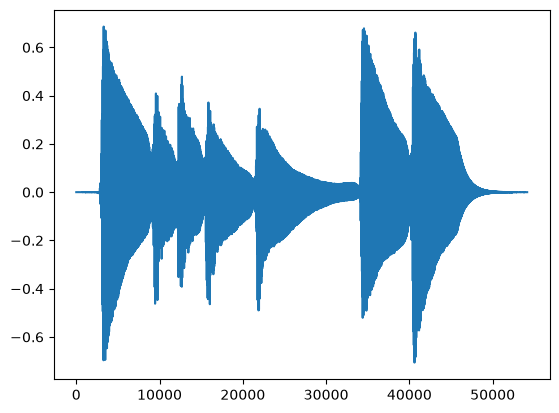

54144 samples


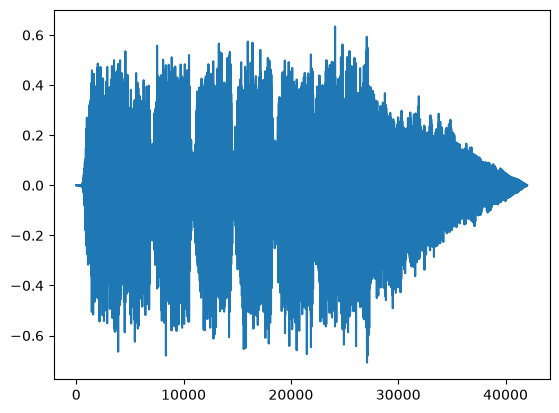

42020 samples


In [82]:
two_bit_file_path = "./data/two-bits.wav"
two_bit_samples, sr = librosa.load(two_bit_file_path)

air_horn_file_path = "./data/air-horn.wav"
air_horn_samples, sr = librosa.load(air_horn_file_path)

plt.plot(two_bit_samples)
plt.show()
display(Audio(two_bit_file_path))
print(len(two_bit_samples), "samples")

plt.plot(air_horn_samples)
plt.show()
display(Audio(air_horn_file_path))
print(len(air_horn_samples), "samples")

# TODO: sum samples
sum_samples = []

for s1, s2 in zip(two_bit_samples, air_horn_samples):
    sum_samples.append(s1 + s2)


### Check results of sum

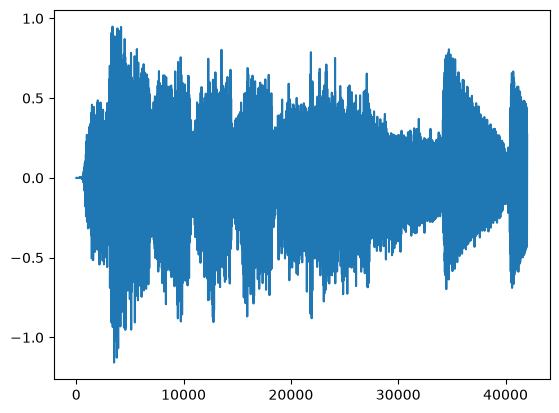

42020 samples


In [76]:
plt.plot(sum_samples)
plt.show()
display(Audio(sum_samples, rate=sr))
print(len(sum_samples), "samples")

### Splicing

Here we want to add the second wave after the first.

In Python we can use addition to concatenate two lists:
```python
A = [0,1,2,3]
B = [4,5,6,7]
C = A + B
```

The `C` variable now holds `[0,1,2,3,4,5,6,7]`.

We can also use slicing to select parts of the two sounds before adding them.

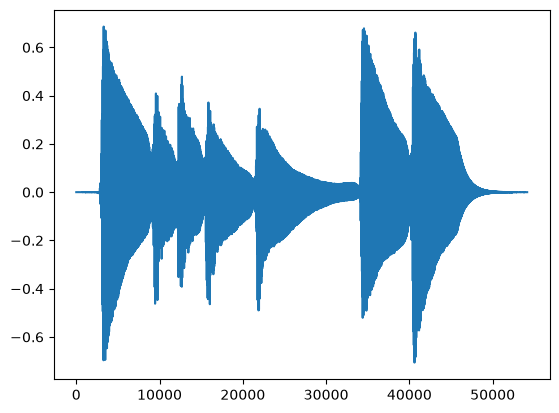

54144 samples


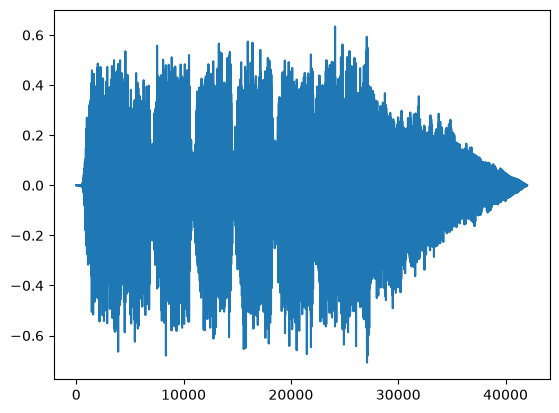

42020 samples


In [ ]:
two_bit_file_path = "./data/two-bits.wav"
two_bit_samples, sr = librosa.load(two_bit_file_path)

air_horn_file_path = "./data/air-horn.wav"
air_horn_samples, sr = librosa.load(air_horn_file_path)

plt.plot(two_bit_samples)
plt.show()
display(Audio(two_bit_file_path))
print(len(two_bit_samples), "samples")

plt.plot(air_horn_samples)
plt.show()
display(Audio(air_horn_file_path))
print(len(air_horn_samples), "samples")

### This sum just places the second audio right after the first

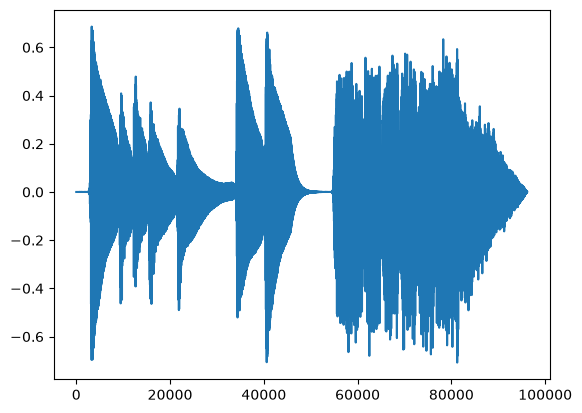

96164 samples


In [81]:
sum_samples = list(two_bit_samples) + list(air_horn_samples)

plt.plot(sum_samples)
plt.show()
display(Audio(sum_samples, rate=sr))
print(len(sum_samples), "samples")

### This sum keeps $60\%$ of the first audio and then starts the second audio

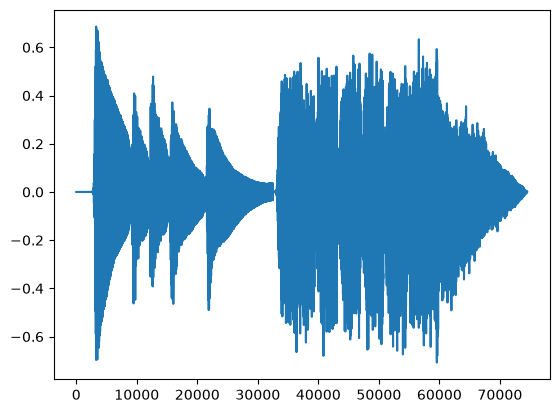

74506 samples


In [ ]:
end_idx = int(0.6 * len(two_bit_samples))

sum_samples = list(two_bit_samples[:end_idx]) + list(air_horn_samples)

plt.plot(sum_samples)
plt.show()
display(Audio(sum_samples, rate=sr))
print(len(sum_samples), "samples")

## Audio Analysis

### Time-Domain

There are a couple of simple analysis and transformations that we can perform on our samples to extract information about them and our audio signal as a whole.

These are sometimes called _time-domain features_ because they are concerned with how an audio signal changes over time.

Since the information we want to extract from the samples will hopefully tell us something about the audio's characteristic in terms of loudness or pitch, it's useful if we work with chunks of audio that are long enough for us to notice these properties.

What this means is that we will further split our list of samples into smaller lists that contain about $10$ - $50$ milliseconds of audio.

This process is sometimes called _windowing_ or _blocking_, and the result is a list of lists, where the outer list gives us a list of windows or blocks and the internal lists are just regular lists of samples:

<img src="https://psam-5020-2026f-a.github.io/5020-imgs/WK03/window-00.jpg" height="250px">

<img src="https://psam-5020-2026f-a.github.io/5020-imgs/WK03/window-01.jpg" height="250px">

### Let's open up an audio file and split it into lists of 1024 samples

In [ ]:
file_path = "./data/two-bits.wav"
all_samples, sr = librosa.load(file_path)

# variable for number of samples per window, or, the window length
WLEN = 1024

# first sample index for each window: [ 0, 1024, 2048, 3072, 4096, ... ]
wx = range(0, len(all_samples), WLEN)

samples_win = []
for s in wx:
  samples_win.append(all_samples[s : s + WLEN])

len(samples_win), len(samples_win[0]), len(all_samples)

### Root Mean Square Energy

Now that we have our list split into chunks/blocks/windows, we can calculate some properties for each of these windows.

The first will be a measurement of loudness called the root mean square energy. This is calculated by taking the square root of the arithmetic mean of the squares of our sample values, or:

$ rms = \sqrt{\frac{1}{n} ({s_0}^2 + {s_1}^2 + {s_2}^2 + ... + {s_{n-1}^2})}$

<img src="https://psam-5020-2026f-a.github.io/5020-imgs/WK03/window-02.jpg" height="250px">

### Let's write a function that implements this

It will receive a list of samples and return their rms value.

First we can calculate the squares of all the samples with a comprehension, then find the average value of this array $\displaystyle \left(\frac{sum}{length}\right)$, and finally take the square root.

Remember that in python we can take the square root of a number $x$ by raising it to $0.5$, like `x ** 0.5`.

In [ ]:
# TODO: implement rms
def rms(window_samples):
  # HERE
  return []

### Now, we'll use that to compute the rms for each of our windows

In [ ]:
# TODO: compute the rms of each window in samples_win

samples_rms = []

If we compare the length of our two arrays (`all_samples` and `samples_rms`) and also plot their contents, we'll see that even though one of them is 1000 times smaller, it's still able to represent enough information about how the loudness of the sound changes over time.

This is good because if we wanted to compare it to other sounds to find similarities, instead of comparing $100,000$ values we can now compare $100$.

We'll see more about this in the homework.

In [ ]:
print(len(all_samples), len(samples_rms))

plt.plot(all_samples)
plt.plot(wx, samples_rms, "r")
plt.show()